In [111]:
import os
import pandas as pd
import numpy as np
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
%matplotlib inline

In [120]:
#Loading the y-paramter from file, might be changed to y_a etc.
y_a = pd.read_parquet('../Data_and_task/A/train_targets.parquet')
y_b = pd.read_parquet('../Data_and_task/B/train_targets.parquet')
y_c = pd.read_parquet('../Data_and_task/C/train_targets.parquet')

In [121]:
#Loading estimated/forecasted training_weather from file
X_estimated_a = pd.read_parquet('../Data_and_task/A/X_train_estimated.parquet')
X_estimated_b = pd.read_parquet('../Data_and_task/B/X_train_estimated.parquet')
X_estimated_c = pd.read_parquet('../Data_and_task/C/X_train_estimated.parquet')

In [122]:
#Loading observed weather from file
X_observed_a = pd.read_parquet('../Data_and_task/A/X_train_observed.parquet')
X_observed_b = pd.read_parquet('../Data_and_task/B/X_train_observed.parquet')
X_observed_c = pd.read_parquet('../Data_and_task/C/X_train_observed.parquet')

In [123]:
X_test_a = pd.read_parquet('../Data_and_task/A/X_test_estimated.parquet')
X_test_b = pd.read_parquet('../Data_and_task/B/X_test_estimated.parquet')
X_test_c = pd.read_parquet('../Data_and_task/C/X_test_estimated.parquet')

In [144]:
def resize_training_data(X_train, y_train):
    y_features = y_train.columns.tolist()
    X_date_feature = "date_forecast"
    X_date_calc_feature = "date_calc"
    merged = pd.merge(X_train, y_train,left_on=X_date_feature, right_on='time', how='inner')
    y_train_resized = merged[y_features]
    columns_to_drop = y_features + [X_date_feature, X_date_calc_feature]
    X_train_resized = merged.drop(columns = columns_to_drop)
    return X_train_resized, y_train_resized

In [145]:
X_a = pd.concat([X_observed_a, X_estimated_a])
X_train_universal, y_train_universal = resize_training_data(X_a, y_a)

# Y vs feature plots

# Y plots

/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623

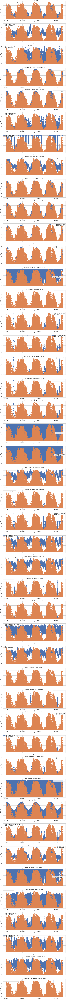

In [131]:
df = X_train_universal.drop(columns = ["date_calc"])
df_target = y_train_universal

df.index = pd.to_datetime(df.index)
df_target.index = pd.to_datetime(df_target.index)

# Scaling the data
scaler_x = MinMaxScaler()
df_scaled = pd.DataFrame(scaler_x.fit_transform(df), columns=df.columns, index=df.index)

scaler_y = MinMaxScaler()
# Ensuring that df_target contains only numeric columns
df_target_numeric = df_target.select_dtypes(include=[np.number])

# Applying the MinMaxScaler only on the numeric columns
scaler_y = MinMaxScaler()
df_target_scaled = pd.DataFrame(scaler_y.fit_transform(df_target_numeric), 
                               columns=df_target_numeric.columns, 
                               index=df_target_numeric.index)

# Number of features to plot
num_features = len(df.columns)

# Creating a figure
plt.figure(figsize=(15, 5*num_features))

for i, col in enumerate(df.columns, 1):
    plt.subplot(num_features, 1, i)
    
    plt.plot(df_scaled.index, df_scaled[col], label=f'Scaled Feature: {col}', linestyle='-', marker='o')
    plt.plot(df_target_scaled.index, df_target_scaled['pv_measurement'], label='Scaled PV Measurement', linestyle='-', marker='o')
    
    plt.xlabel('Time')
    plt.ylabel('Scaled Values')
    plt.title(f'Scaled {col} and PV Measurement over Time')
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# Sort the data based on datetime
y_a.sort_values('time', inplace=True)
y_b.sort_values('time', inplace=True)
y_c.sort_values('time', inplace=True)

# Plotting
plt.figure(figsize=(10, 6))

plt.subplot(3, 1, 1)
plt.plot(y_a['time'], y_a['pv_measurement'])
plt.title('y_a')

plt.subplot(3, 1, 2)
plt.plot(y_b['time'], y_b['pv_measurement'])
plt.title('y_b')

plt.subplot(3, 1, 3)
plt.plot(y_c['time'], y_c['pv_measurement'])
plt.title('y_c')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Sine function to fit
def model(x, a, b, c, d):
    return a * np.sin(b * x + c) + d
df = y_a
# Assuming df is your DataFrame and it has columns 'date_time' and 'pv_measurement'
# Convert date_time to a numeric value representing hours since the start
df['time_numeric'] = np.arange(len(df))

x_data = df['time_numeric'].values
y_data = df['pv_measurement'].values

# Initial guess: a=amplitude, b=frequency, c=phase shift, d=vertical shift
# Frequency b is set to 2*pi/(24*365.25) to represent a yearly cycle
initial_guess = [np.max(y_data) - np.min(y_data), 2*np.pi/(24*365.25), 0, np.mean(y_data)]

# Curve fitting
params, params_covariance = curve_fit(model, x_data, y_data, p0=initial_guess)

# Applying the model with the obtained parameters to data points
y_fitted = model(x_data, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df['time'], y_data, 'r', label='Original Data')
plt.plot(df['time'], y_fitted, 'b', label='Fitted Data')
plt.xlabel('Time')
plt.ylabel('PV Measurement')
plt.title('Data Fitting with a Yearly Sine Wave')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Lag

In [101]:
import pandas as pd

def feature_engineering(X, y, lags, window):
    """
    Perform feature engineering on X using values from y.
    """
    # Extract pv_measurement as the target variable
    y_target = y['pv_measurement']
    
    # Ensure the target has a name
    if y_target.name is None:
        y_target.name = 'target'
    
    # Combine X and y for easier lag and rolling window calculations
    df = pd.concat([X, y_target], axis=1)
    
    # Creating lag features
    for lag in lags:
        df[f'lag_{lag}'] = df[y_target.name].shift(lag)
    
    # Creating rolling window features
    df[f'rolling_mean_{window}'] = df[y_target.name].rolling(window=window).mean()
    df[f'rolling_std_{window}'] = df[y_target.name].rolling(window=window).std()
    
    # Drop NaN values which were introduced by lag and rolling window features
    df = df.dropna()
    
    # Separate the features and target variable
    X_engineered = df.drop(columns=[y_target.name])
    y_engineered = df[y_target.name]
    
    return X_engineered, y_engineered

# Now, you can call the function with your X_train and y_train DataFrames
X_train_engineered, y_train_engineered = feature_engineering(X_train_universal, y_train_universal, lags=[1, 2, 3], window=3)

In [92]:
X_train_engineered = X_train_engineered.drop(columns = ["date_calc"])

In [66]:
display(X_train_engineered)

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,lag_1,lag_2,lag_3,rolling_mean_3,rolling_std_3
16676,3.6,1.291,3935.100098,0.000000e+00,0.000000,528.099976,0.0,269.399994,0.000000,0.000000,...,31458.000000,2.3,1.7,1.6,-0.0,0.22,8.58,19.14,4.546667,4.187712
16681,2.4,1.314,3603.199951,0.000000e+00,0.000000,1352.199951,0.0,264.200012,0.000000,0.000000,...,20302.500000,2.9,0.9,2.7,-0.0,5.50,6.82,18.48,4.766667,2.501946
16682,2.2,1.317,3556.199951,0.000000e+00,0.000000,1781.000000,0.0,263.500000,0.000000,0.000000,...,26865.099609,2.9,0.9,2.8,-0.0,1.98,5.50,6.82,9.900000,10.813621
16683,2.1,1.317,4026.500000,2.189730e+04,14.900000,1902.000000,0.0,262.899994,14.800000,26592.599609,...,32314.599609,2.9,0.9,2.8,-0.0,22.22,1.98,5.50,37.253333,44.726781
16684,2.1,1.317,2508.399902,7.474290e+04,24.700001,972.400024,0.0,262.899994,21.900000,66093.296875,...,29288.400391,2.7,1.0,2.5,-0.0,87.56,22.22,1.98,79.640000,53.898204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17377,3.9,1.241,3440.300049,1.422458e+06,371.500000,1077.900024,0.0,270.399994,142.199997,537476.500000,...,51039.601562,3.2,-2.5,2.0,-0.0,1344.42,1215.94,1565.74,1086.140000,342.171510
17378,4.1,1.240,7476.600098,1.210754e+06,295.899994,3251.000000,0.0,271.000000,113.099998,459560.593750,...,51062.699219,1.7,-1.7,0.3,-0.0,698.06,1344.42,1215.94,964.626667,337.728472
17379,4.3,1.241,7202.500000,8.888449e+05,194.699997,1168.599976,0.0,271.700012,93.199997,371215.593750,...,49285.300781,2.8,-2.5,1.1,-0.0,851.40,698.06,1344.42,793.613333,83.354842
17380,4.3,1.242,4460.200195,5.030874e+05,85.900002,1182.300049,0.0,271.799988,52.400002,262070.906250,...,49750.800781,2.4,-1.7,1.7,-0.0,831.38,851.40,698.06,628.393333,369.056825


In [89]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

# Split the engineered features and target variable into a training and test set
X_train, X_test, y_train, y_test = train_test_split(X_train_engineered, y_train_engineered, test_size=0.1, shuffle = False)

# Instantiate and train a Random Forest model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():


RandomForestRegressor(random_state=42)

In [90]:
# Test your model using the engineered test set
y_pred = model.predict(X_test)

# Evaluate the model performance
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Squared Error on Test Data: {mae}")

Mean Squared Error on Test Data: 16.885400000000022


/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():


In [ ]:
# Make predictions
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor

def predict_sequentially(X_test, initial_y_lags, model):
    predictions = []
    y_lags = list(initial_y_lags)
    for i in range(len(X_test)):
        # Add y_lags to the X_test
        X_test_with_lags = np.append(X_test.iloc[i], y_lags[-1:])
        display(X_test_with_lags)
        # Predict the next value
        prediction = model.predict([X_test_with_lags])[0]
        predictions.append(prediction)
        
        # Update y_lags with the predicted value
        y_lags.append(prediction)
        
    return predictions

# Assuming last_y_train_values contains the last few values from y_train
last_y_train_values = y_train["pv_measurement"].iloc[-3:].values

In [75]:
# Get the predictions
predictions = predict_sequentially(X_test_a[::4].drop(columns = ["date_forecast"]), last_y_train_values, model)

array([Timestamp('2023-04-30 07:00:04'), 4.4, 1.286, 912.7, 0.0, 0.0,
       1041.2, 0.0, 271.7, 0.0, 0.0, 0.0, 0.0, 80.7, 6.0, 0.0, 0.0, 0.0,
       0.0, 0.0, 0.0, 1.0, 1013.9, 0.0, 0.0, 1000.7, 1007.0, 0.0, 0.0,
       80.3, 1013.3, nan, 0.0, 0.0, 0.0, 0.0, 10.52, -11.185, 0.0, 273.8,
       80.7, 30210.7, 4.0, 2.2, 3.4, -0.0, 1344.4199999999998],
      dtype=object)

ERROR! Session/line number was not unique in database. History logging moved to new session 128


/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


TypeError: float() argument must be a string or a number, not 'Timestamp'

# Correlation

absolute_humidity_2m:gm3     air_density_2m:kgm3   -0.811630
                             dew_point_2m:K         0.974607
                             t_1000hPa:K            0.907083
air_density_2m:kgm3          dew_point_2m:K        -0.845869
                             t_1000hPa:K           -0.917245
ceiling_height_agl:m         cloud_base_agl:m       0.709431
clear_sky_energy_1h:J        clear_sky_rad:W        0.992517
                             diffuse_rad:W          0.912133
                             diffuse_rad_1h:J       0.923205
                             direct_rad:W           0.725202
                             direct_rad_1h:J        0.737702
                             is_day:idx             0.646241
                             is_in_shadow:idx      -0.687676
                             sun_elevation:d        0.835068
clear_sky_rad:W              diffuse_rad:W          0.918115
                             diffuse_rad_1h:J       0.915686
                        

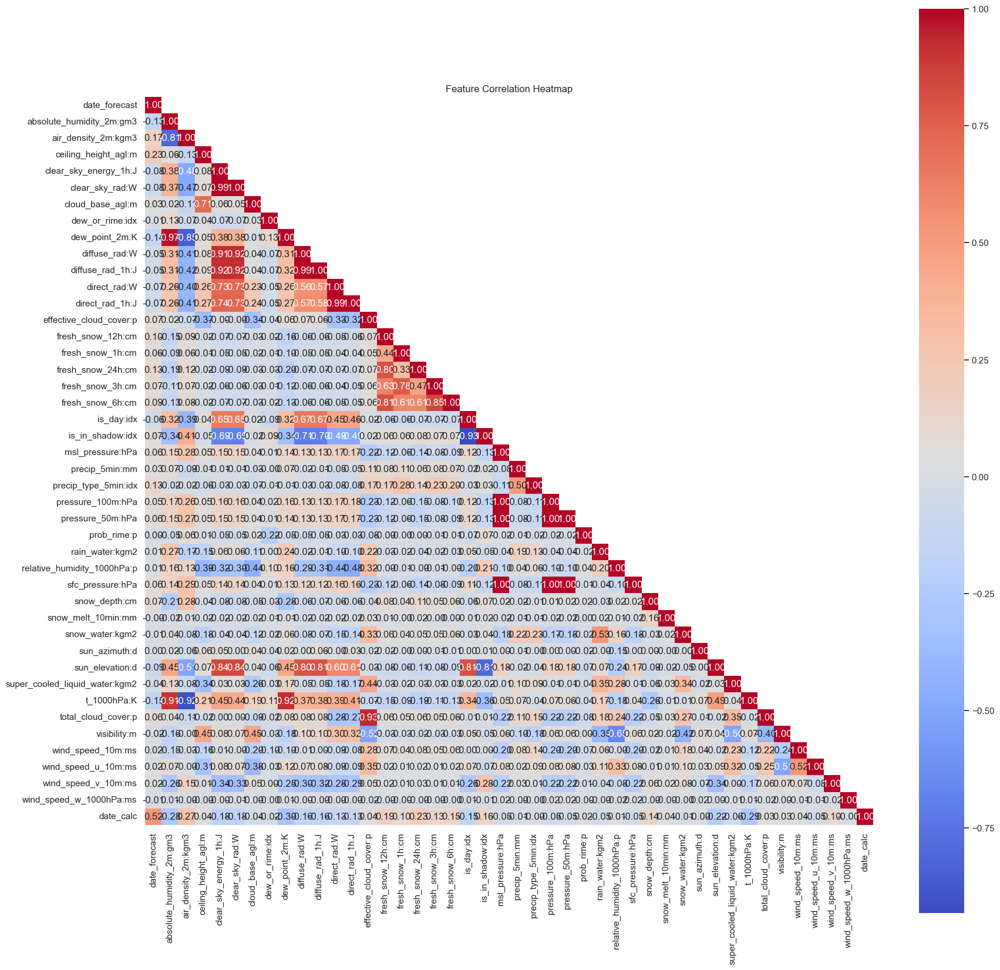

In [150]:
#Training, validation and test
X_train_observed_a = X_observed_a.drop(columns =["elevation:m", "snow_density:kgm3", "snow_drift:idx"]).copy()
X_train_estimated_a = X_estimated_a[:int(X_estimated_a.shape[0] * 3 / 4)].drop(columns =["elevation:m", "snow_density:kgm3", "snow_drift:idx"]).copy()
X_valid_estimated_a = X_estimated_a[int(X_estimated_a.shape[0] * 3 / 4):int(X_estimated_a.shape[0] * 9 / 10)].drop(columns =["elevation:m", "snow_density:kgm3", "snow_drift:idx"]).copy()
X_test_estimated_a = X_estimated_a[int(X_estimated_a.shape[0] * 9 / 10):].drop(columns =["elevation:m", "snow_density:kgm3", "snow_drift:idx"]).copy()

df = pd.concat([X_train_observed_a, X_train_estimated_a], ignore_index=True)

#df = X_train_engineered

# Compute the correlation matrix
corr_matrix = df.corr()

# Create mask for upper triangle of the matrix
mask_upper = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)

# Filter out correlations based on the range
strongly_correlated_pairs = corr_matrix.where(
    mask_upper & ((corr_matrix >= 0.6) | (corr_matrix <= -0.6))
).stack()

print(strongly_correlated_pairs)

# Plot the heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", cbar=True, square=True, fmt='.2f', mask=mask_upper)
plt.title("Feature Correlation Heatmap")
plt.show()

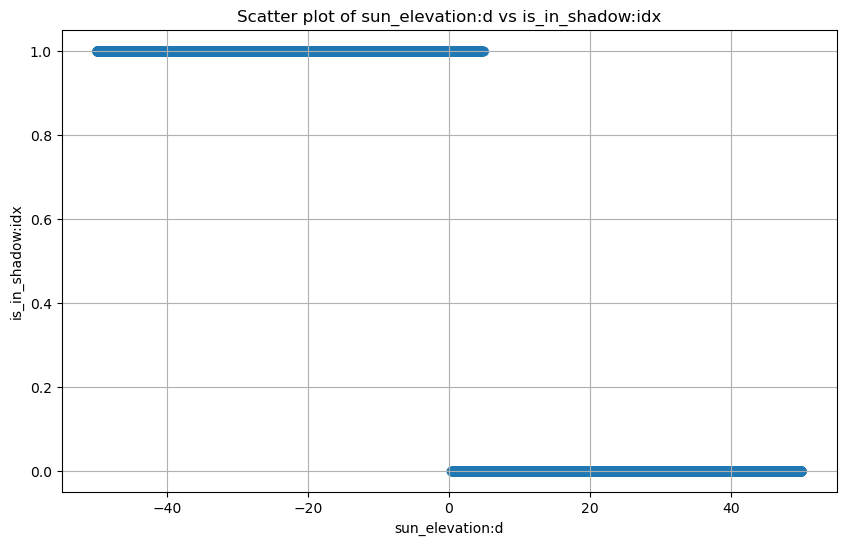

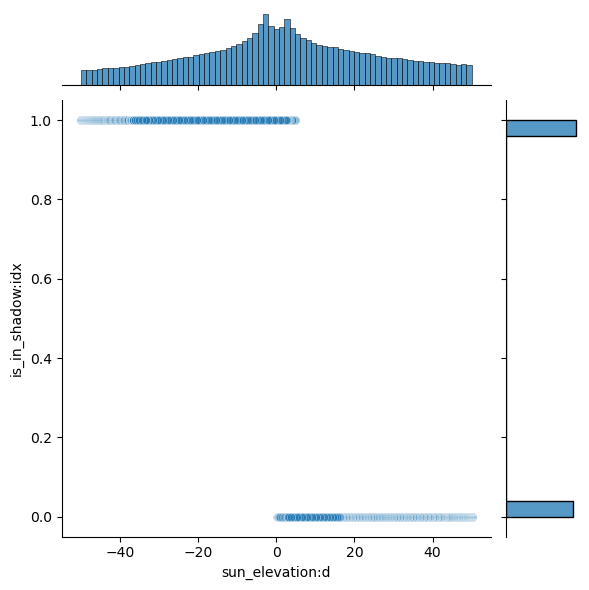

In [7]:
# Assuming df is your DataFrame
feature1 = "sun_elevation:d"  # Replace with the name of your first feature
feature2 = "is_in_shadow:idx"  # Replace with the name of your second feature

plt.figure(figsize=(10, 6))
plt.scatter(X_observed_a[feature1], X_observed_a[feature2], alpha=0.5)
plt.title(f"Scatter plot of {feature1} vs {feature2}")
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.grid(True)
plt.show()

sns.jointplot(data=X_observed_a, x=feature1, y=feature2, kind='scatter', joint_kws={'alpha':0.5})
plt.show()

# Checking for diffences in the datasets, min, max, mean

In [8]:
y_a = y_a[y_a['pv_measurement'] != 0]
statistics = y_a.describe()
print(statistics)

                             time  pv_measurement
count                       18045    18045.000000
mean   2021-04-26 01:05:44.139651     1191.123336
min           2019-06-03 02:00:00        0.220000
25%           2020-05-25 16:00:00      127.820000
50%           2021-05-15 02:00:00      599.940000
75%           2022-05-06 14:00:00     1838.980000
max           2023-04-30 19:00:00     5733.420000
std                           NaN     1378.401846


In [9]:
y_b = y_b[y_b['pv_measurement'] != 0]
statistics = y_b.describe()
print(statistics)

                             time  pv_measurement
count                       15536    15532.000000
mean   2020-10-31 11:38:48.784757      204.745881
min           2019-01-01 10:00:00        0.000208
25%           2019-10-22 09:45:00       28.939212
50%           2020-08-19 06:30:00      115.575000
75%           2021-08-07 10:15:00      276.000000
max           2023-04-30 19:00:00     1152.300000
std                           NaN      239.679247


In [10]:
y_c = y_c[y_c['pv_measurement'] != 0]
statistics = y_c.describe()
print(statistics)

                             time  pv_measurement
count                       16203    10143.000000
mean   2020-07-15 02:42:29.083503      199.722222
min           2018-12-31 23:00:00        0.980000
25%           2019-06-18 17:30:00       36.260000
50%           2020-06-01 04:00:00      117.600000
75%           2021-06-13 23:00:00      294.000000
max           2023-04-30 20:00:00      999.600000
std                           NaN      215.301692


# Scatterplots

In [11]:
"""# Assuming df_target has a single column named 'target'
target_column = 'pv_measurement'
df_features, df_target = resize_training_data(X_observed_a, y_a)

# Looping through each feature column in the DataFrame
for feature in df_features.columns:
    plt.figure(figsize=(6, 4))
    
    # Create a scatter plot for each feature vs the target
    plt.scatter(df_features[feature], df_target[target_column])
    
    # Adding title and labels
    plt.title(f'Scatterplot of {feature} vs {target_column}')
    plt.xlabel(feature)
    plt.ylabel(target_column)
    
    # Display the plot
    plt.show()"""

"# Assuming df_target has a single column named 'target'\ntarget_column = 'pv_measurement'\ndf_features, df_target = resize_training_data(X_observed_a, y_a)\n\n# Looping through each feature column in the DataFrame\nfor feature in df_features.columns:\n    plt.figure(figsize=(6, 4))\n    \n    # Create a scatter plot for each feature vs the target\n    plt.scatter(df_features[feature], df_target[target_column])\n    \n    # Adding title and labels\n    plt.title(f'Scatterplot of {feature} vs {target_column}')\n    plt.xlabel(feature)\n    plt.ylabel(target_column)\n    \n    # Display the plot\n    plt.show()"

# Seaborn scatterplots with lin_func

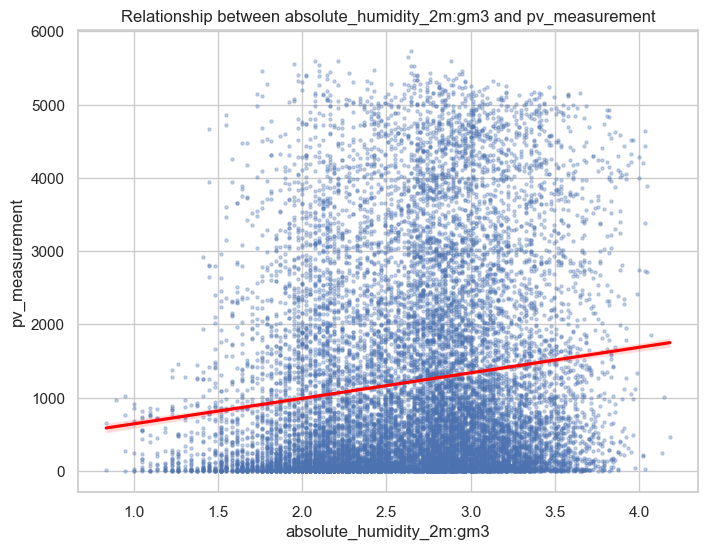

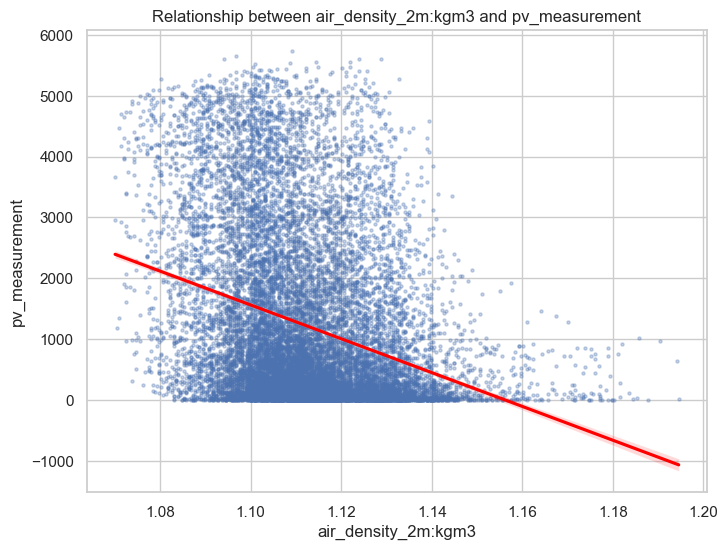

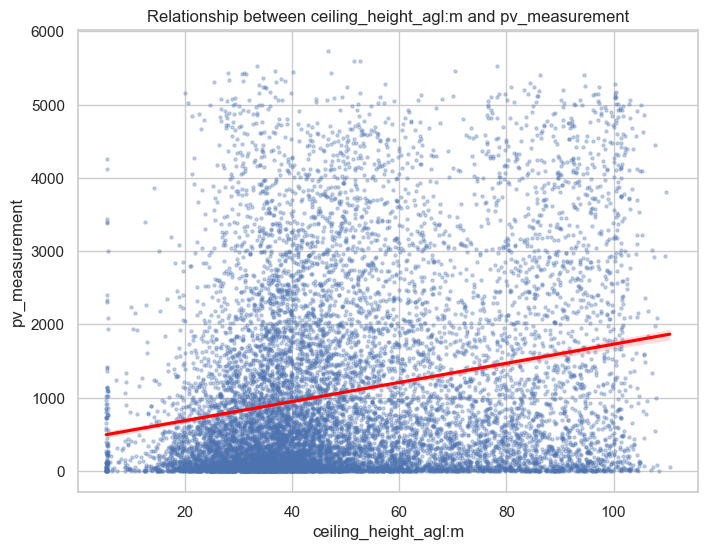

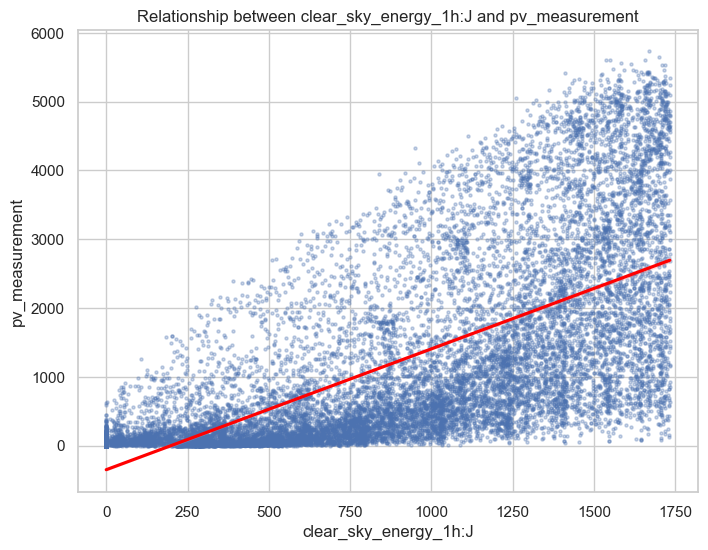

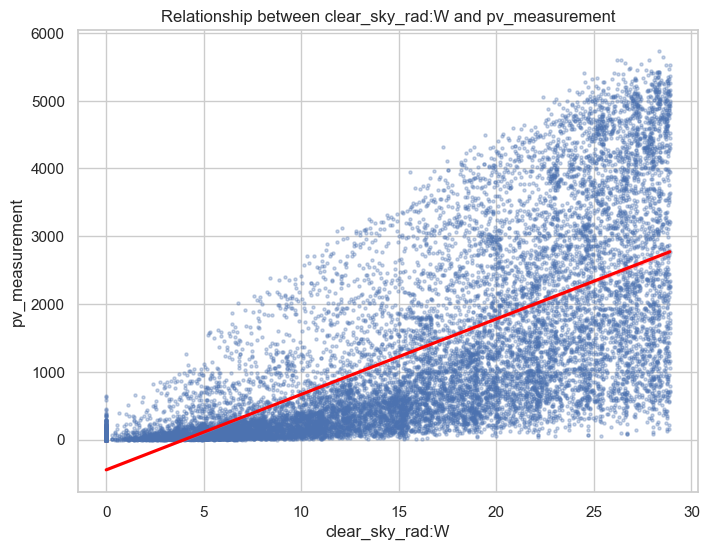

...

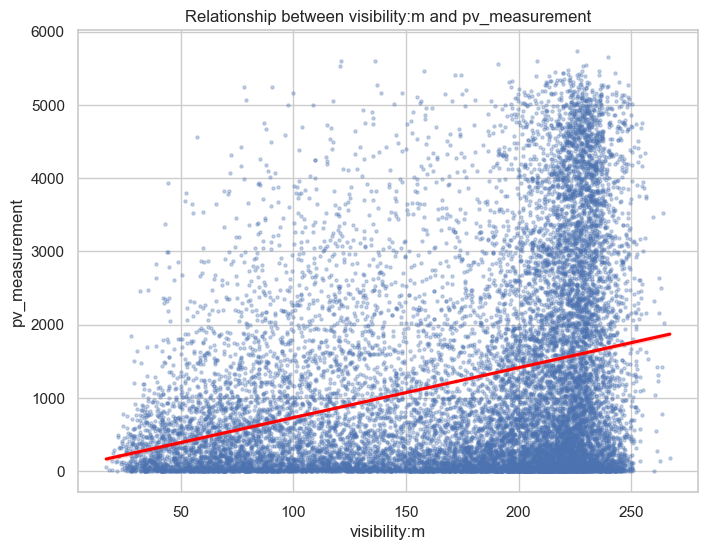

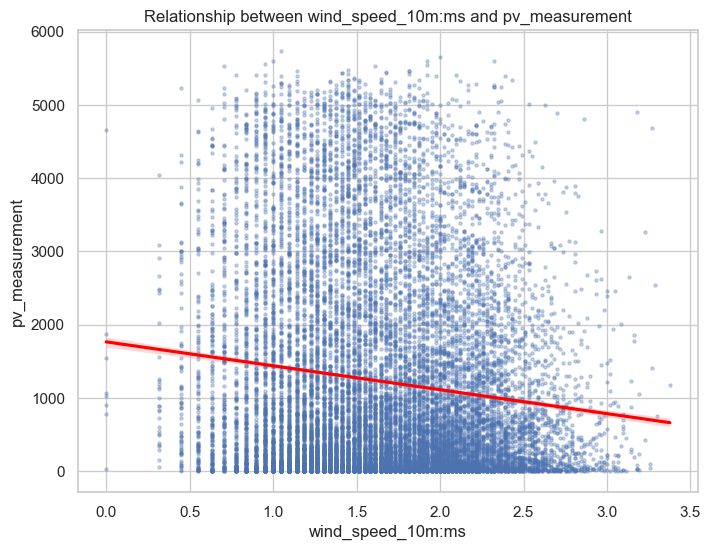

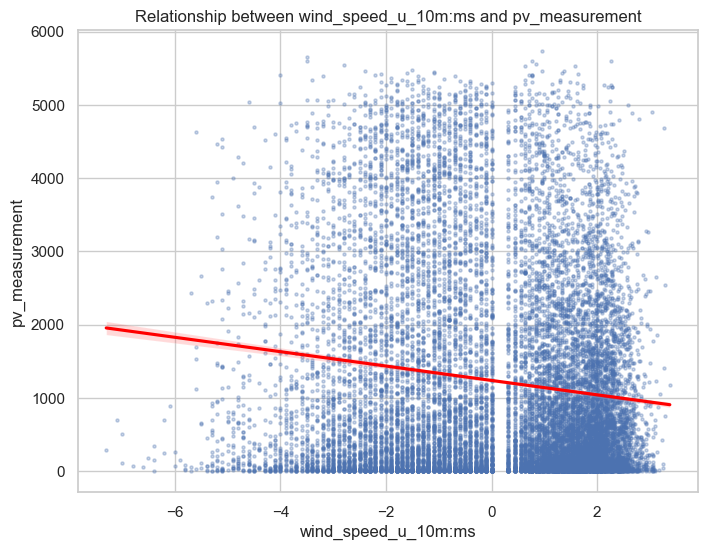

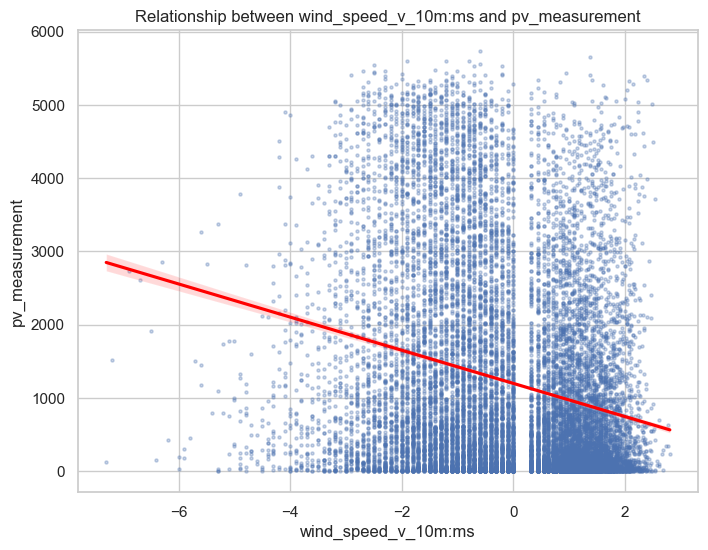

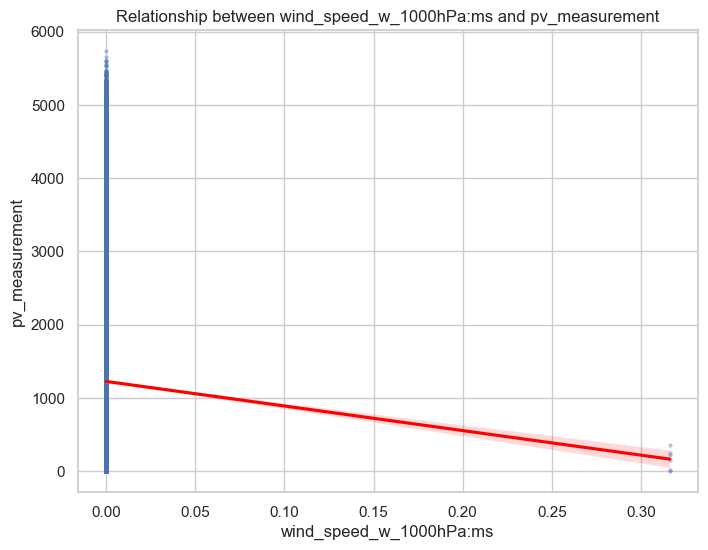

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
df_scaled_features, df_target = resize_training_data(X_observed_a, y_a)
target_column = 'pv_measurement'
df_features = df_scaled_features.map(lambda x: np.sqrt(x) if x > 0 else x)

# Adjusting the style of the plots
sns.set(style="whitegrid")

for feature in df_features.columns:
    plt.figure(figsize=(8, 6))
    
    # Creating a scatterplot with a regression line
    sns.regplot(x=df_features[feature], y=df_target[target_column], scatter_kws={'s':5, 'alpha':0.3}, line_kws={'color':'red'})
    
    # Adding titles and labels
    plt.title(f'Relationship between {feature} and {target_column}')
    plt.xlabel(feature)
    plt.ylabel(target_column)
    
    # Displaying the plot
    plt.show()

# Normalized scatterplots [-1,1]

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Assuming resize_training_data returns pandas DataFrames
df_scaled_features, df_target = resize_training_data(X_observed_a, y_a)

#scaler = MinMaxScaler(feature_range=(-1, 1))
#scaled_features = scaler.fit_transform(df_features)

#df_scaled_features = df_scaled_features.map(lambda x: np.sqt(x,3) if x > 0 else x)
df_scaled_features = df_scaled_features.map(lambda x: -np.power(x,2) if x > 0 else x)
# Converting scaled features from ndarray to DataFrame
#df_scaled_features = pd.DataFrame(scaled_features, columns=df_features.columns)

# Looping through each feature column in the DataFrame
for feature in df_scaled_features.columns:
    plt.figure(figsize=(6, 4))
    
    # Create a scatter plot for each feature vs the target
    plt.scatter(df_scaled_features[feature], df_target['pv_measurement'])
    
    # Adding title and labels
    plt.title(f'Scatterplot of {feature} vs pv_measurement')
    plt.xlabel(feature)
    plt.ylabel('pv_measurement')
    
    # Display the plot
    plt.show()


# PCA

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Assume df is your DataFrame, and target is what you want to predict
X, y = resize_training_data(X_observed_a, y_a)
y = y["pv_measurement"]
X.fillna(X.mean(), inplace=True)
# Splitting the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizing the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Applying PCA
pca = PCA(n_components=2)  # choose the number of components
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Now, you can use X_train_pca and X_test_pca for modeling

In [147]:
df_features, df_target = (X_train_universal, y_train_universal)
def preprocess_data(df):
    # Handling missing values by filling them with the mean of each column
    df.fillna(df.mean(), inplace=True)
    
    # Replacing infinite values with NaN
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    # Dropping rows that still have NaN values
    df.dropna(inplace=True)
    
    return df

# Preprocess both the feature and target DataFrames
df_features = preprocess_data(df_features.copy())
df_target = preprocess_data(df_target.copy())

# Ensure that the DataFrames have the same index
common_index = df_features.index.intersection(df_target.index)
df_features = df_features.loc[common_index]
df_target = df_target.loc[common_index]


In [149]:
import itertools
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error



def evaluate_combinations(X_df, y_df, target_column):
    X = X_df.copy()
    y = y_df[target_column].values
    
    # Splitting the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, shuffle = False)
    
    features = X.columns
    results = []
    
    for r in range(1, len(features)+1):
        # Creating combinations of features of length r
        for subset in itertools.combinations(features, r):
            selected_features = list(subset)
            
            # Fitting and evaluating the model
            model = LinearRegression().fit(X_train[selected_features], y_train)
            predictions = model.predict(X_test[selected_features])
            mae = mean_absolute_error(y_test, predictions)
            
            results.append({
                'features': selected_features,
                'mae': mae
            })
    
    # Converting results to DataFrame and sorting by mse
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values(by='mae', ascending=True)
    
    return results_df

selected_features = ['direct_rad:W', 'direct_rad_1h:J', 'clear_sky_rad:W', 'clear_sky_energy_1h:J',
                 'diffuse_rad:W', 'diffuse_rad_1h:J', 'sun_elevation:d', 'is_in_shadow:idx', 'is_day:idx',
                 'relative_humidity_1000hPa:p', 't_1000hPa:K', 'sun_azimuth:d', 'fresh_snow_6h:cm']
df_features = df_features[selected_features]

# Run the function
results = evaluate_combinations(df_features, df_target, 'pv_measurement')

/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623

In [99]:
print(results)

                                               features          mae
7131  [direct_rad:W, direct_rad_1h:J, clear_sky_rad:...   457.364262
7841  [direct_rad:W, direct_rad_1h:J, clear_sky_rad:...   457.388315
7845  [direct_rad:W, direct_rad_1h:J, clear_sky_rad:...   457.411598
8116  [direct_rad:W, direct_rad_1h:J, clear_sky_rad:...   457.423556
7835  [direct_rad:W, direct_rad_1h:J, clear_sky_rad:...   457.520681
...                                                 ...          ...
84                       [is_day:idx, fresh_snow_6h:cm]  1061.312717
83                          [is_day:idx, sun_azimuth:d]  1061.737227
90                    [sun_azimuth:d, fresh_snow_6h:cm]  1112.513805
12                                   [fresh_snow_6h:cm]  1112.859104
11                                      [sun_azimuth:d]  1114.579721

[8191 rows x 2 columns]


In [100]:
for i in range(10):
    print(results.iloc[i]["features"])

['direct_rad:W', 'direct_rad_1h:J', 'clear_sky_rad:W', 'clear_sky_energy_1h:J', 'diffuse_rad:W', 'diffuse_rad_1h:J', 'relative_humidity_1000hPa:p', 'sun_azimuth:d', 'fresh_snow_6h:cm']
['direct_rad:W', 'direct_rad_1h:J', 'clear_sky_rad:W', 'clear_sky_energy_1h:J', 'diffuse_rad:W', 'diffuse_rad_1h:J', 'is_in_shadow:idx', 'relative_humidity_1000hPa:p', 'sun_azimuth:d', 'fresh_snow_6h:cm']
['direct_rad:W', 'direct_rad_1h:J', 'clear_sky_rad:W', 'clear_sky_energy_1h:J', 'diffuse_rad:W', 'diffuse_rad_1h:J', 'is_day:idx', 'relative_humidity_1000hPa:p', 'sun_azimuth:d', 'fresh_snow_6h:cm']
['direct_rad:W', 'direct_rad_1h:J', 'clear_sky_rad:W', 'clear_sky_energy_1h:J', 'diffuse_rad:W', 'diffuse_rad_1h:J', 'is_in_shadow:idx', 'is_day:idx', 'relative_humidity_1000hPa:p', 'sun_azimuth:d', 'fresh_snow_6h:cm']
['direct_rad:W', 'direct_rad_1h:J', 'clear_sky_rad:W', 'clear_sky_energy_1h:J', 'diffuse_rad:W', 'diffuse_rad_1h:J', 'is_in_shadow:idx', 'is_day:idx', 'relative_humidity_1000hPa:p', 'fresh_sno